<a href="https://colab.research.google.com/github/Prathyusha-Akundi/Soil-Classification/blob/main/Soil_pre_rocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import *
import os

# Region of Interest (ROI) extraction

In [3]:
def get_roi_mask(img):
  im_gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
  blurred = cv2.GaussianBlur(im_gray, (15,15), 0)
  ret,thresh =   cv2.threshold(blurred, 0, 255,	cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,15))
  opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
  closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel)
  dilation = cv2.dilate(closing,kernel,iterations = 2)
  return dilation

In [4]:
def get_roi(img, thresh):
  max_area = img.shape[0]*img.shape[1]
  max_area*0.25
  # find contours 
  contours, hierarchy = cv2.findContours(thresh,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
  areas = [cv2.contourArea(contour) for contour in contours]
  found = False
  for i in range(len(areas)):
    area = areas[i]
    if(area>(max_area*0.25) and area<max_area*0.9):
      cnt = contours[i]
      # straight rectangle
      x,y,w,h = cv2.boundingRect(cnt)
      final = img[y:y+h, x:x+w]
      plt.imshow(final)
      plt.title('Area: {0}'.format(area));
      plt.show()
      found = True
      break
  if not found:
    final = img
    plt.imshow(final)
    plt.title('Area: {0}'.format(max_area));
    plt.show()
  return final

In [5]:
def roi_runner(img):
  roi_mask = get_roi_mask(img)
  final_roi = get_roi(img, roi_mask)
  return final_roi

# Patches

In [6]:
from sklearn.feature_extraction import image
from mpl_toolkits.axes_grid1 import ImageGrid

In [7]:
def get_pathces(img, size=256, max_patches=25):
  patches = image.extract_patches_2d(img, (size,size), max_patches = max_patches)
  return patches

In [31]:
# https://www.pyimagesearch.com/2017/06/05/computing-image-colorfulness-with-opencv-and-python/
def image_colorfulness(image):
	# split the image into its respective RGB components
	(B, G, R) = cv2.split(image.astype("float"))
	# compute rg = R - G
	rg = np.absolute(R - G)
	# compute yb = 0.5 * (R + G) - B
	yb = np.absolute(0.5 * (R + G) - B)
	# compute the mean and standard deviation of both `rg` and `yb`
	(rbMean, rbStd) = (np.mean(rg), np.std(rg))
	(ybMean, ybStd) = (np.mean(yb), np.std(yb))
	# combine the mean and standard deviations
	stdRoot = np.sqrt((rbStd ** 2) + (ybStd ** 2))
	meanRoot = np.sqrt((rbMean ** 2) + (ybMean ** 2))
	# derive the "colorfulness" metric and return it
	return stdRoot + (0.5 * meanRoot)

In [23]:
def visualize_patches(patches):
  fig = plt.figure(figsize=(20,40))
  grid = ImageGrid(fig, 111,  # similar to subplot(111)
                  nrows_ncols=(2, 5),  # creates 2x2 grid of axes
                  axes_pad=0.5,  # pad between axes in inch.
                  )

  for ax, im in zip(grid, [patches[i] for i in np.random.choice(np.arange(len(patches)),10, replace=True)]):
      # Iterating over the grid returns the Axes.
      colourfullness = image_colorfulness(im)
      ax.imshow(im)
      ax.set_title(colourfullness)
      ax.axis('off')


In [10]:
def preprocess_patches(patches, threshold = 12):
  final_patches = []
  for patch in patches:
    colourfullness = image_colorfulness(patch)
    if(colourfullness>threshold):
      final_patches.append(patch)
  return final_patches

In [11]:
def save_patches(patches, filename):
  prefix = filename.split('.')[0]
  for i,patch in enumerate(patches):
    patch = Image.fromarray(patch)
    patch.save(root_dir+'preprocessed_irsid/'+prefix+'_patch_{0}.png'.format(i))

## Testing on sample image

In [12]:
root_dir = '/content/drive/MyDrive/Upwork/Soil Classification/Datasets/'
file_names = []
for filename in next(os.walk(root_dir+'IRSID/'))[2]:
  file_names.append(filename)

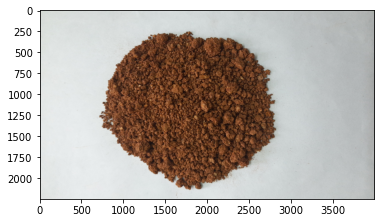

In [13]:
img = plt.imread(root_dir+'IRSID/'+file_names[0])
plt.imshow(img)

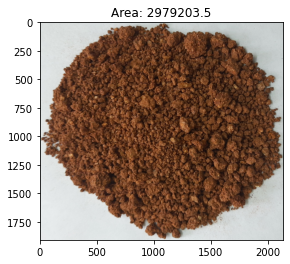

In [14]:
roi = roi_runner(img)

In [15]:
patches = get_pathces(roi)

In [16]:
patches.shape

(25, 256, 256, 3)

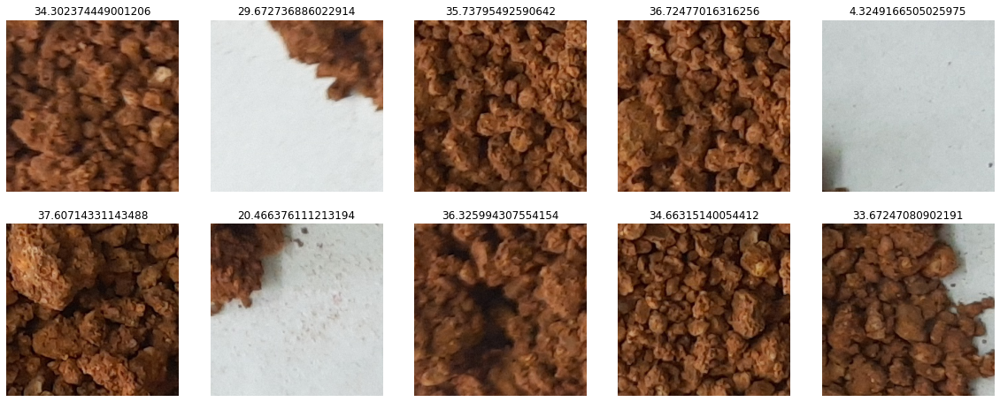

In [17]:
visualize_patches(patches)

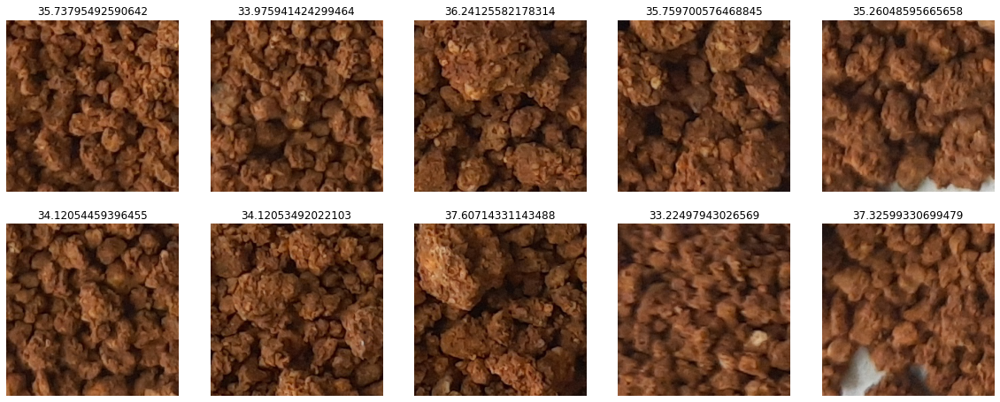

In [18]:
final_patches = preprocess_patches(patches)
visualize_patches(final_patches)

# Preprocess

In [41]:
def runner_preprocess(filename, visualize = True):
  img = plt.imread(root_dir+'IRSID/'+filename)
  print('**********************************************')
  print('Getting ROI for file: {0}'.format(filename))
  roi = roi_runner(img)
  print('Get patches')
  patches = get_pathces(roi, max_patches=50)
  print('Get final patches')
  final_patches = preprocess_patches(patches, threshold=13)
  if visualize:
    visualize_patches(final_patches)
  save_patches(final_patches, filename)




**********************************************
Getting ROI for file: Sample14.jpg


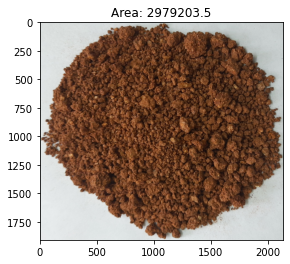

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample12.jpg


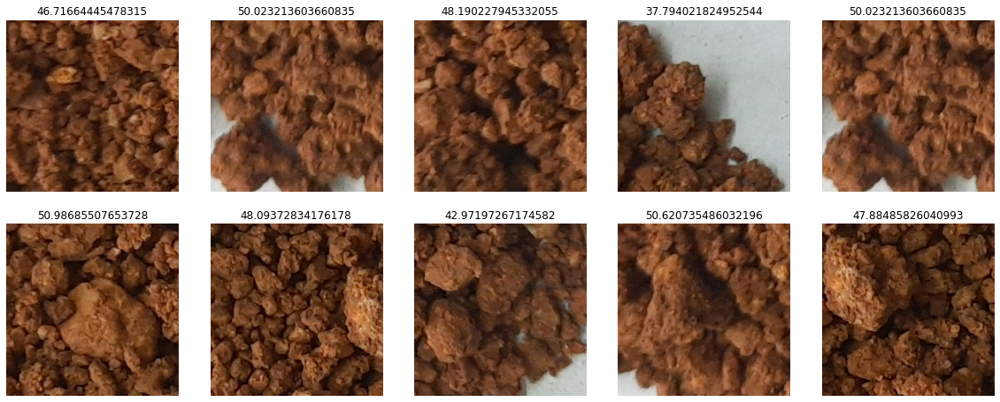

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample6.jpg


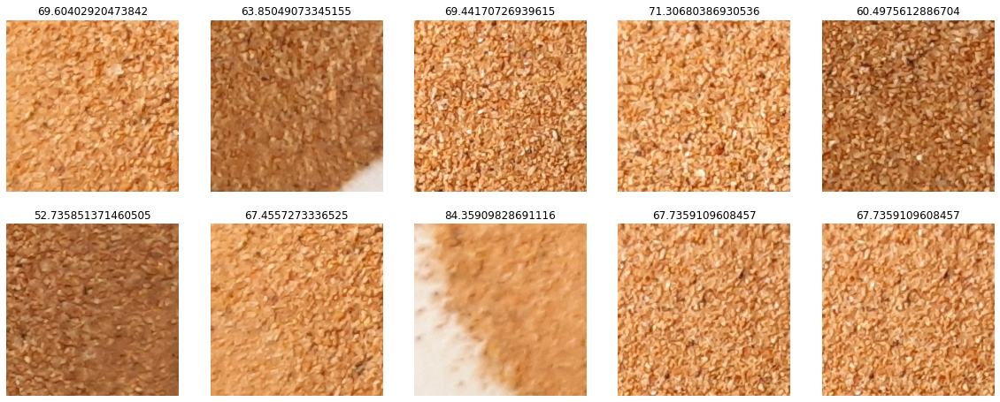

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample2.jpg


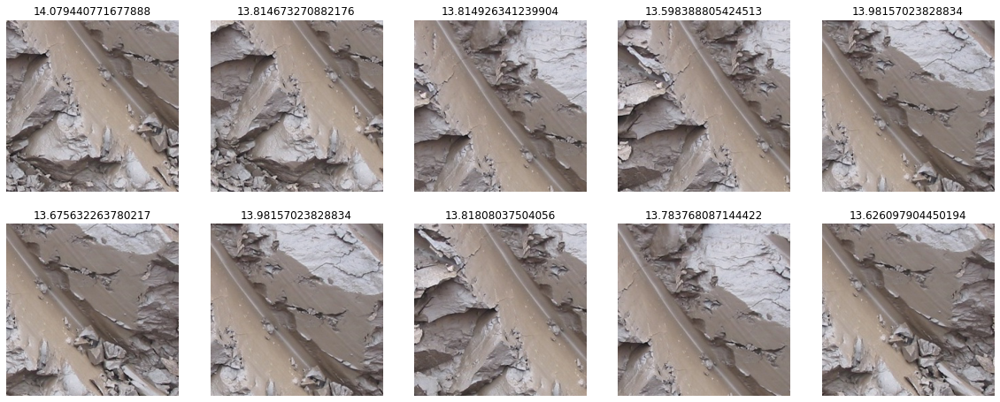

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample4.jpg


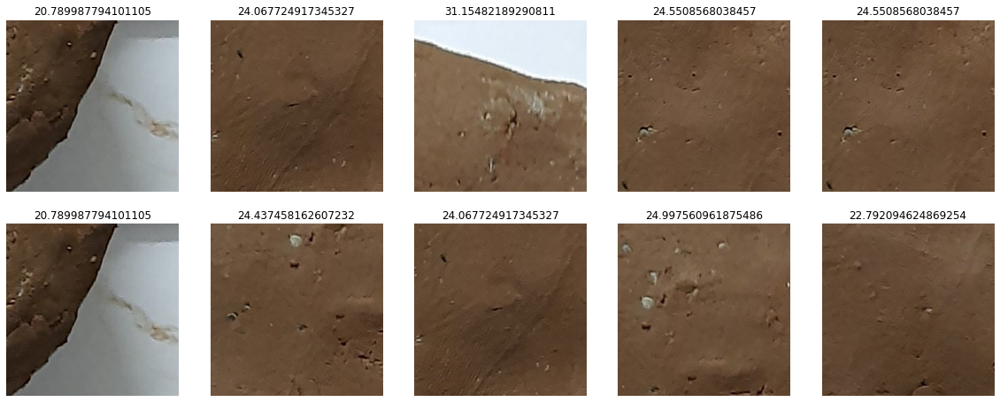

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample5.jpg


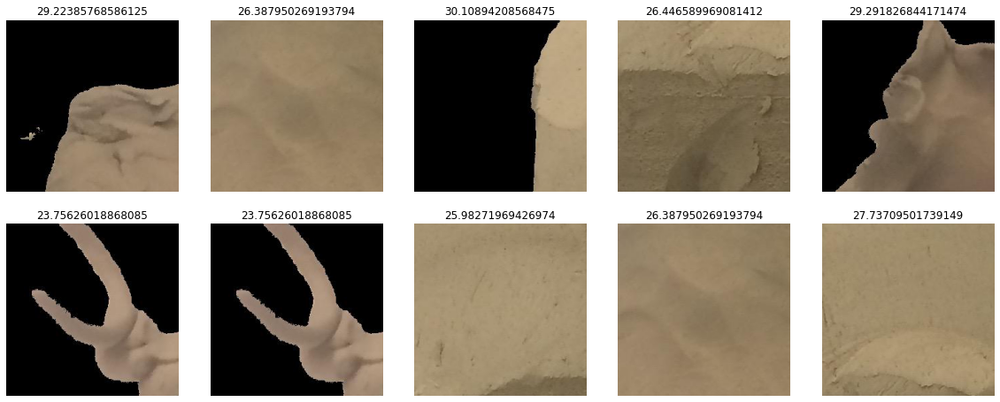

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample11.jpg


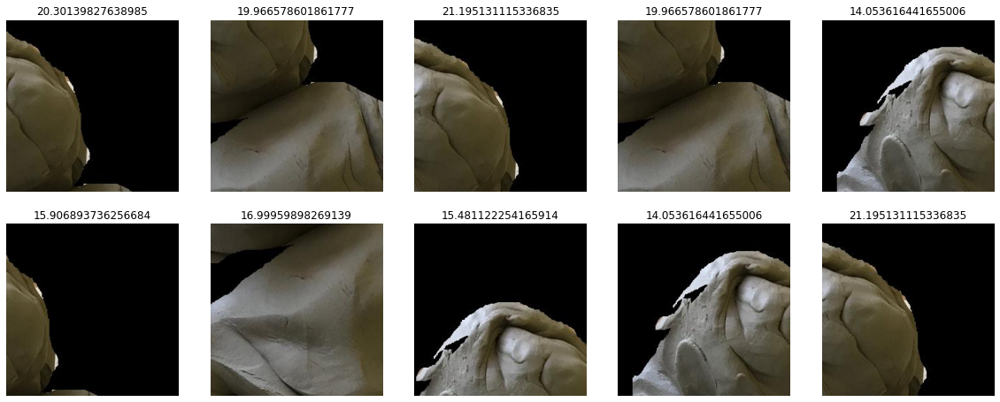

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample8.jpg


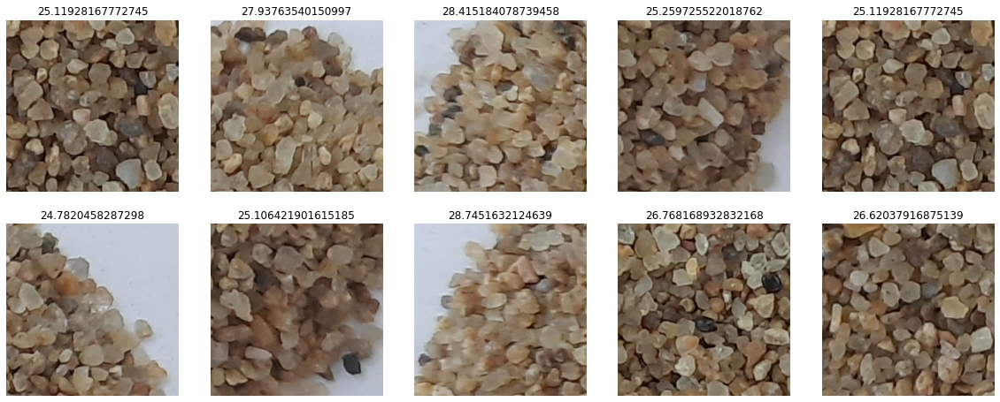

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample9.jpg


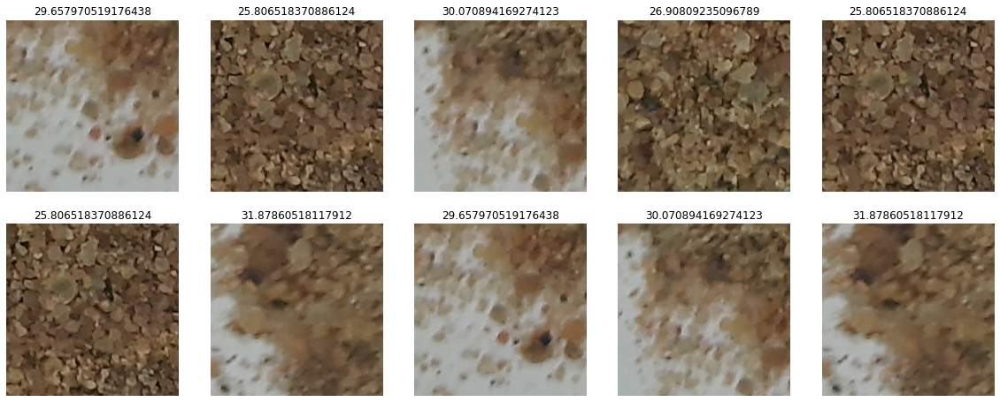

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample16.jpg


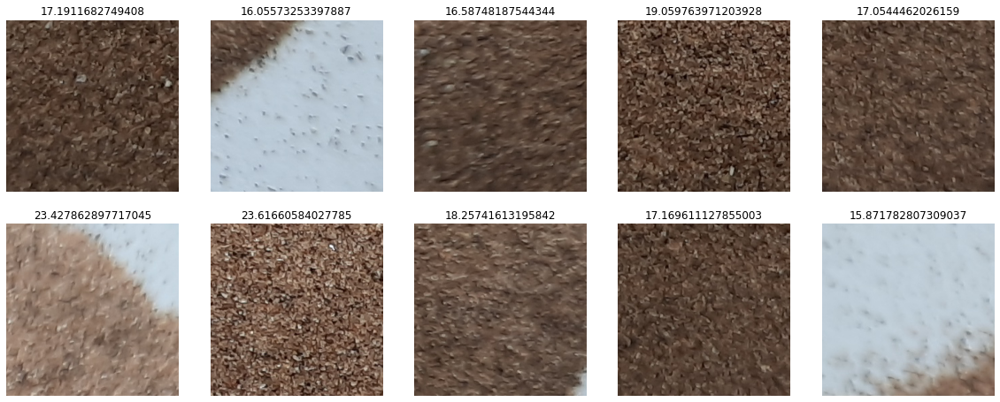

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample7.jpg


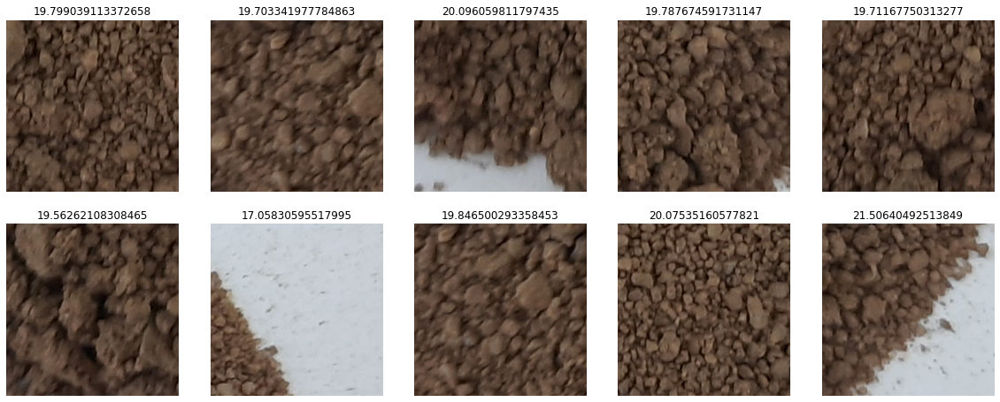

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample1.jpg


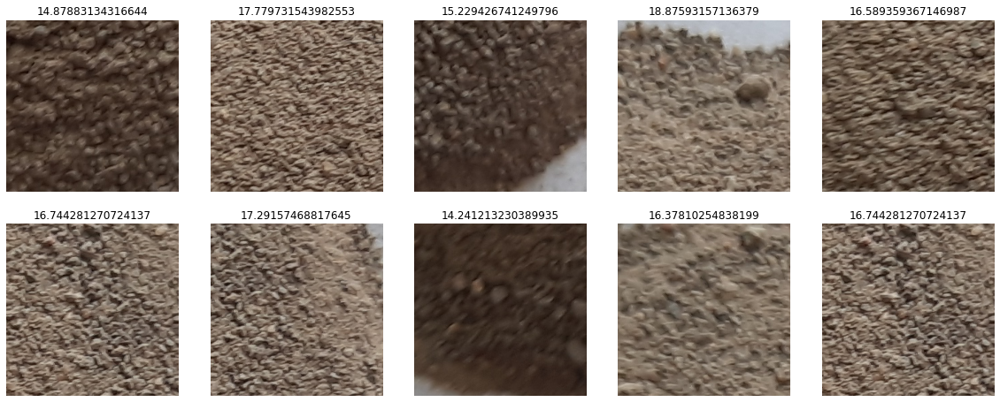

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample10.jpg


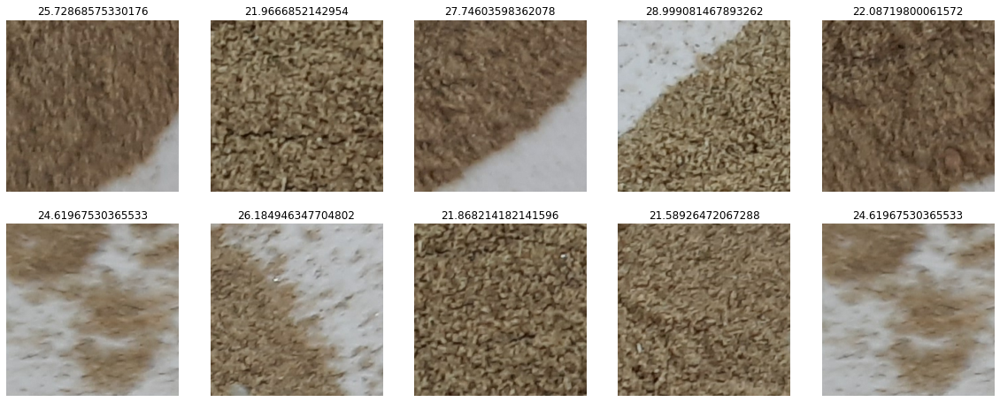

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample13.jpg


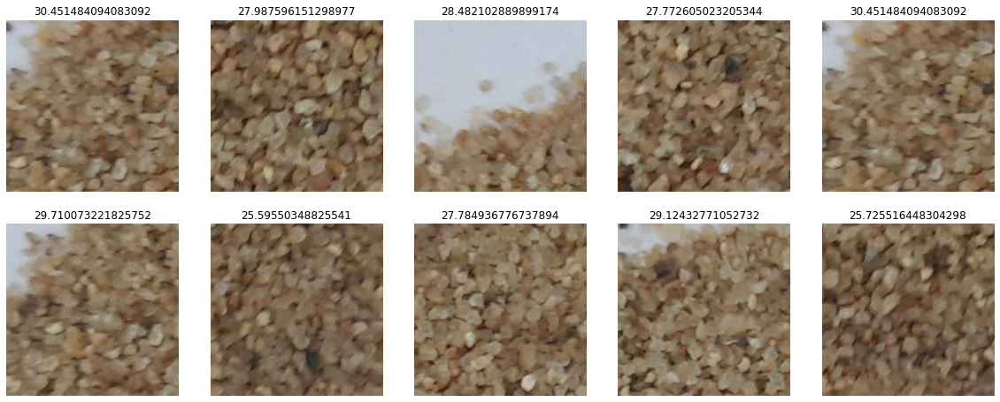

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample3.jpg


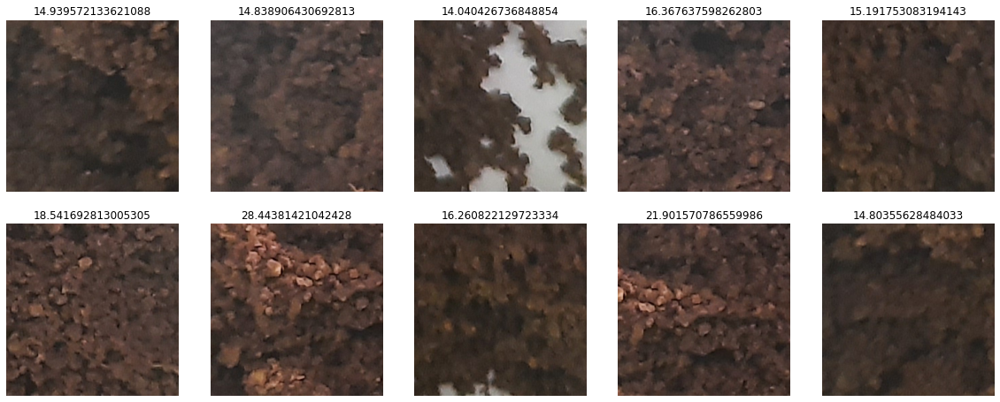

Get patches
Get final patches
**********************************************
Getting ROI for file: Sample15.jpg


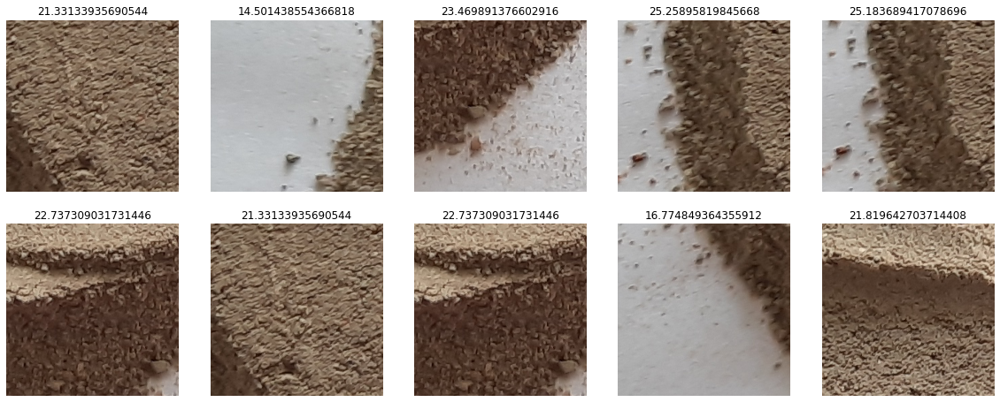

Get patches
Get final patches


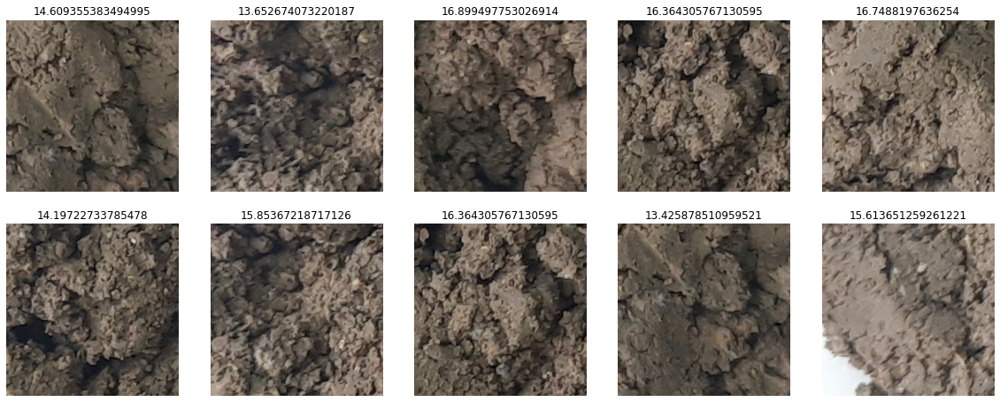

In [42]:
for i in range(len(file_names)):
  runner_preprocess(file_names[i], visualize = True)